In [2]:
import random
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import time as tm
from time import time
import seaborn as sns
import fitsio
import pandas as pd
from galpy.potential import MWPotential2014, vcirc, evaluateRforces
from galpy.orbit import Orbit
from scipy.stats import gaussian_kde
import corner
from scipy.stats import norm
from sklearn.mixture import GaussianMixture

from astroquery.gaia import Gaia
from astropy.table import Table
from astropy.table import Table, vstack
from glob import glob
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.metrics import balanced_accuracy_score
from sklearn.linear_model import LinearRegression
import os
from datetime import datetime

# Setup and helper functions moved to external module
from equations_file import *

# If you change the external module and want live reload during development, uncomment:
# %load_ext autoreload
# %autoreload 2

In [3]:
Vmans_NGC3201 = pd.read_csv(
    Vmans_NGC3201_txt,
    sep='\t',
    header=0
)
Vmans_NGC3201.columns = Vmans_NGC3201.columns.str.replace('#', '').str.strip()
Vmans_NGC3201_high_prob = Vmans_NGC3201[(Vmans_NGC3201['memberprob'] > 0.99)]# & (Vmans_NGC3201['qflag'] == 0)]




Vmans_NGC5139 = pd.read_csv(
    Vmans_NGC5139_txt,
    sep='\t',
    header=0
)
Vmans_NGC5139.columns = Vmans_NGC5139.columns.str.replace('#', '').str.strip()
Vmans_NGC5139_high_prob = Vmans_NGC5139[(Vmans_NGC5139['memberprob'] > 0.99)]# & (Vmans_NGC5139['qflag'] == 0)]



Vmans_NGC1851 = pd.read_csv(
    Vmans_NGC1851_txt,
    sep='\t',
    header=0
)
Vmans_NGC1851.columns = Vmans_NGC1851.columns.str.replace('#', '').str.strip()
Vmans_NGC1851_high_prob = Vmans_NGC1851[(Vmans_NGC1851['memberprob'] > 0.99)]# & (Vmans_NGC5139['qflag'] == 0)]

In [4]:
with fitsio.FITS(galah_Gaia_fits) as hdul1:
    data_1 = hdul1[1].read()
galah_Gaia_raw = pd.DataFrame(data_1)
galah_Gaia_raw = ensure_native_endian(galah_Gaia_raw)
# galah_Gaia = Table.read(galah_Gaia_csv, format="csv")
# galah_Gaia = galah_Gaia.to_pandas()

In [6]:
galah_Gaia = galah_Gaia_raw[(galah_Gaia_raw['snr_px_ccd3'] > 30)       # Kushniruk 2026 also has cuts in log g and temp. I wonder if I should as well
                        & (galah_Gaia_raw['flag_sp'] == 0)
                        & (galah_Gaia_raw['flag_fe_h'] == 0)
                        & (galah_Gaia_raw['e_fe_h'] < 0.2)
                        & (galah_Gaia_raw['flag_sp_fit'] == 0)
                        & (galah_Gaia_raw['flag_red'] == 0)
                        & (galah_Gaia_raw['ruwe'] < 1.4)
                        & (galah_Gaia_raw['logg'] < 3.5)
                        & (galah_Gaia_raw['teff'] > 4000)
                        & (galah_Gaia_raw['teff'] < 6500)
                        # & (galah_Gaia_raw['flag_mg_fe'] == 0)
                        # & (galah_Gaia_raw['flag_na_fe'] == 0)
                        # & (galah_Gaia_raw['flag_cu_fe'] == 0)
                        & (galah_Gaia_raw['fe_h'] < -0.75)
                        # & (galah_Gaia_raw['fe_h'] < -0.9)
                        # & (galah_Gaia_raw['ti_fe'] > 0.25)
                        & (galah_Gaia_raw['survey_name'].isin(['galah_faint', 'galah_bright', 'galah_main',
                                                               'k2_hermes', 'galah_phase2', 'tess_hermes'
                                                               ]))
    ]

In [7]:
# NGC5139_Galah = galah_Gaia[(galah_Gaia['ra'] > 201.2)
#                              & (galah_Gaia['ra'] < 202.2) 
#                              & (galah_Gaia['dec'] > -47.8)
#                              & (galah_Gaia['dec'] < -47.2)
#                              & (galah_Gaia['pmra'] < 1)
#                              & (galah_Gaia['pmra'] > -6)
#                              & (galah_Gaia['pmdec'] < -4)
#                              & (galah_Gaia['pmdec'] > -10)
#                              & (galah_Gaia['jphi'] < 0)
#                              ]

# NGC3201_Galah = galah_Gaia[(galah_Gaia['pmra'] > 6.5)
#                             & (galah_Gaia['pmra'] < 10)
#                             & (galah_Gaia['pmdec'] > -3.5)
#                             & (galah_Gaia['pmdec'] < -1)
#                             # & (galah_Gaia['fe_h'] < 0.0)
#                             & (galah_Gaia['ra'] > 152)
#                             & (galah_Gaia['ra'] < 156)
#                             & (galah_Gaia['dec'] > -49)
#                             & (galah_Gaia['dec'] < -44)
#                             & (galah_Gaia['jphi'] < 0)
#                             ]

NGC3201_galah = pd.merge( galah_Gaia, Vmans_NGC3201_high_prob, left_on = 'gaiadr3_source_id', right_on = 'source_id', how = 'inner')
NGC5139_galah = pd.merge( galah_Gaia, Vmans_NGC5139_high_prob, left_on = 'gaiadr3_source_id', right_on = 'source_id', how = 'inner')
NGC1851_galah = pd.merge( galah_Gaia, Vmans_NGC1851_high_prob, left_on = 'gaiadr3_source_id', right_on = 'source_id', how = 'inner')

galah_Kushniruk_GSE = galah_Gaia[((((np.sqrt(galah_Gaia['jr'])-35)**2) / (17.5**2)) + (((galah_Gaia['jphi'] + 130)**2) / (250**2)) < 1)
                                 & (~galah_Gaia['gaiadr3_source_id'].isin(NGC5139_galah['gaiadr3_source_id']))
                                 & (galah_Gaia_raw['flag_mg_fe'] == 0)
                                 & (galah_Gaia_raw['flag_na_fe'] == 0)
                                 & (galah_Gaia_raw['flag_cu_fe'] == 0)
                                 & ((galah_Gaia_raw['mg_fe'] - galah_Gaia_raw['cu_fe']) - ((1.06923) * galah_Gaia_raw['na_fe']) > 0.40150)
                                 ]

# Kushniruk et al . 2026 https://doi.org/10.1051/0004-6361/202451201
galah_Kushniruk_Thamnos1 = galah_Gaia[((((np.sqrt(galah_Gaia['jr'])- 13.5)**2) / (4.0**2)) + (((galah_Gaia['jphi'] + 600)**2) / (350**2)) < 1)
                                        # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC3201_galah['gaiadr3_source_id']))
                                        # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC5139_galah['gaiadr3_source_id']))
                                        # & (galah_Gaia['survey_name'].isin(['galah_faint', 'galah_bright', 'galah_main']))
                                      ]

galah_Kushniruk_Thamnos2 = galah_Gaia[(((np.sqrt(galah_Gaia['jr'])-8.6)**2) / (3.5**2)) + (((galah_Gaia['jphi'] + 1184)**2) / (175**2)) < 1
                                        # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC3201_galah['gaiadr3_source_id']))
                                        # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC5139_galah['gaiadr3_source_id']))
                                        # & (galah_Gaia['survey_name'].isin(['galah_faint', 'galah_bright', 'galah_main']))
                                      ]

# Feuillet et al. 2021 https://doi.org/10.1093/mnras/stab2614
galah_Gaia_GSE = galah_Gaia[GSE_cuts_Diane_2021(galah_Gaia)
                            # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC3201_galah['gaiadr3_source_id']))
                            # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC5139_galah['gaiadr3_source_id']))
                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Kushniruk_Thamnos1['gaiadr3_source_id']))
                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Kushniruk_Thamnos2['gaiadr3_source_id']))
                            # & (galah_Gaia['fe_h'] < -0.8)
                            ]

galah_Gaia_Sequoia = galah_Gaia[Sequoia_cuts_Diane_2021(galah_Gaia)
                            # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC3201_galah['gaiadr3_source_id']))
                            # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC5139_galah['gaiadr3_source_id']))
                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Kushniruk_Thamnos1['gaiadr3_source_id']))
                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Kushniruk_Thamnos2['gaiadr3_source_id']))
                            # & (galah_Gaia['fe_h'] < -0.8)
                            ]

# Koppelman et al. 2019  https://doi.org/10.1051/0004-6361/201936738
galah_Gaia_Halo = galah_Gaia[(np.sqrt((galah_Gaia['vphi']-230)**2 + (galah_Gaia['vr'])**2 + (galah_Gaia['vz'])**2) > 230) 
                            # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC3201_galah['gaiadr3_source_id']))
                            # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC5139_galah['gaiadr3_source_id']))
                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Kushniruk_Thamnos1['gaiadr3_source_id']))
                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Kushniruk_Thamnos2['gaiadr3_source_id'])) 
                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Gaia_GSE['gaiadr3_source_id']))
                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Gaia_Sequoia['gaiadr3_source_id'])) 
                             ]

/var/folders/k3/63pgq9cd0rvg7fhy2d0q_sj40000gp/T/ipykernel_24413/3028917702.py:28: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  galah_Kushniruk_GSE = galah_Gaia[((((np.sqrt(galah_Gaia['jr'])-35)**2) / (17.5**2)) + (((galah_Gaia['jphi'] + 130)**2) / (250**2)) < 1)



In [11]:
Halo_Pradosh_galah_Gaia = galah_Gaia[(galah_Gaia['fe_h'] < -0.8)
                                            & (galah_Gaia['ti_fe'] > 0.25)
                                            # & (galah_Gaia['flag_ti_fe'] == 0)
                                            & (galah_Gaia['Lz'] > -1500)
                                            & (galah_Gaia['Lz'] < 1500)
                                            & (galah_Gaia['ecc_gaia'] > 0.5)
                                            & (galah_Gaia['ecc_gaia'] < 0.8)
                                            # & (~galah_Gaia['gaiadr3_source_id'].isin(NGC3201_galah['gaiadr3_source_id']))
                                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Gaia_GSE['gaiadr3_source_id']))
                                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Gaia_Sequoia['gaiadr3_source_id']))
                                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Kushniruk_Thamnos1['gaiadr3_source_id']))
                                            & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Kushniruk_Thamnos2['gaiadr3_source_id']))
                                            # & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Gaia_NGC3201_new_ratios['gaiadr3_source_id']))
                                            # & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Gaia_NGC5139_new_ratios['gaiadr3_source_id']))
                                            ]

thickdisk_galah_Gaia = galah_Gaia[(galah_Gaia['fe_h'] < -0.8)
                                                 & (galah_Gaia['ti_fe'] > 0.25)
                                                #  & (galah_Gaia['flag_ti_fe'] == 0)
                                                 & (galah_Gaia['Lz'] > 0)
                                                 & (galah_Gaia['ecc_gaia'] < 0.5)
                                                #  & (~galah_Gaia['gaiadr3_source_id'].isin(NGC3201_galah['gaiadr3_source_id']))
                                                & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Gaia_GSE['gaiadr3_source_id']))
                                                & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Gaia_Sequoia['gaiadr3_source_id']))
                                                & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Kushniruk_Thamnos1['gaiadr3_source_id']))
                                                & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Kushniruk_Thamnos2['gaiadr3_source_id']))
                                                # & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Gaia_NGC3201_new_ratios['gaiadr3_source_id']))
                                                # & (~galah_Gaia['gaiadr3_source_id'].isin(galah_Gaia_NGC5139_new_ratios['gaiadr3_source_id']))
                                            ]
print(len(Halo_Pradosh_galah_Gaia))
print(len(thickdisk_galah_Gaia))

1840
2659


In [12]:

print(len(galah_Gaia_GSE))
print(len(galah_Gaia_Sequoia))
print(len(galah_Gaia_Halo))
print(len(galah_Kushniruk_GSE))
print(len(galah_Kushniruk_Thamnos1))
print(len(galah_Kushniruk_Thamnos2))

873
127
3329
686
218
19


In [ ]:
element_list_full_galah = ["h", "fe", "n", "o", "na", "mg", "al", "si", "k", "ca", "sc" ,"ti" "v", "cr" ,"mn", "co", "ni", "cu", "zn", "rb", "sr", "y", "zr", "mo", "ru", "ba", "la", "ce", "nd", "sm", "eu"]# there is nn_li in galah (nural network Li/Fe) but I dont want to include that right now.
element_list_partial_small_galah_1 = [ 'fe', 'ca', 'ti', 'na', 'mn', 'cu','mg']
element_list_partial_small_galah_2 = [ 'fe', 'ca', 'na', 'mn', 'cu','mg', 'nd']
element_list_partial_small_galah_3 = [ 'cu', 'ca', 'mn', 'ni','v','na', 'nd']
element_list_partial_small_galah_4 = [ 'cu', 'ca', 'mn', 'ti','v','na', 'nd']
element_list_partial_small_galah_5 = [ 'cu', 'ca', 'mn', 'ti','ba','na', 'nd']
element_list_partial_small_galah_6 = [ 'cu', 'ca', 'mn', 'ti', 'v', 'ba','na', 'nd']
element_list_partial_small_galah_7 = [ 'fe', 'cu', 'ca', 'mn', 'ti', 'y', 'ni', 'zn', 'v', 'ba','na', 'nd', 'si', 'k', 'sc', 'cr', 'co']
element_list_partial_small_galah_7_2 = ['cu', 'ca', 'mn', 'ti', 'y', 'ni', 'zn', 'v', 'ba','na', 'nd', 'si', 'k', 'sc', 'cr', 'co']
element_list_partial_small_galah_7_3 = ['fe', 'v', 'sc', 'na', 'mg', 'si', 'k', 'ca', 'ti', 'cr', 'mn', 'co', 'ni', 'cu', 'zn', 'y', 'ba', 'nd']
element_list_partial_small_galah_7_4 = ['fe', 'si', 'nd', 'na', 'mg', 'k', 'ca', 'sc', 'ti', 'v', 'cr', 'mn', 'co', 'ni', 'cu', 'zn', 'y', 'ba']
element_list_partial_small_galah_7_5 = ['v', 'sc', 'na', 'mg', 'si', 'k', 'ca', 'ti', 'cr', 'mn', 'co', 'ni', 'cu', 'zn', 'y', 'ba', 'nd']
element_list_partial_small_galah_8 = [ 'ca', 'mn', 'y', 'v', 'na', 'nd', 'cr', 'sc']
element_list_partial_small_galah_9 = [ 'cu', 'ca', 'mn', 'ti', 'sc', 'v', 'na', 'nd']
element_list_partial_small_galah_10 = ['fe', 'v', 'sc', 'si', 'ca', 'mn', 'co', 'nd']
element_list_partial_small_galah_11 = ['y', 'ba', 'nd', 'eu']
element_list_partial_small_galah_13 = ['si', 'sc', 'v', 'cr', 'mn', 'y', 'nd'] # this is for RFC to compare the GSE and Sequoia with the elm selection form 
element_list_partial_small_galah_14 = ['na', 'si', 'ca', 'sc', 'v', 'mn', 'cu', 'ba'] # this is for RFC to compare the Halo and Sequoia with the elm selection form 
element_list_partial_small_galah_15_1 = ['na', 'ca', 'cr', 'mn', 'cu', 'y', 'nd'] # this is for RFC to compare the Halo and GSE with the elm selection form 
element_list_partial_small_galah_15_2 = ['na', 'ca', 'cr', 'mn', 'cu', 'y', 'nd'] # this is for RFC to compare the Pradosh Halo and GSE with the elm selection form 
elements_in_Pradosh_Galah_1 = ['ca', 'ti', 'ni', 'zr', 'ce', 'nd']
elements_in_Pradosh_Galah_2 = ['ca', 'ti', 'ni', 'nd']

# element_list = element_list_partial_small_galah_9
element_list = element_list_partial_small_galah_14

galah_Gaia_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(galah_Gaia, element_list)

galah_Gaia_new_ratios = galah_Gaia_new_ratios_catolog_ratiolist_ratioerrorlist[0] # this ontains a full catalog from galah but now it includes ratios for Ca, Si, Ti, Ni, Zr, Ce, and Nd relative to eachother: Pradosh did recomend taking out
                                                                 # Si, and Ni whitch I can do by changing "element_list_partial_large" to element_list_partial_small
galah_gaia_new_element_ratio_list = galah_Gaia_new_ratios_catolog_ratiolist_ratioerrorlist[1]     # this just lists the new columns ratios so I can more easily call them
galah_gaia_new_element_ratio_errors_list = galah_Gaia_new_ratios_catolog_ratiolist_ratioerrorlist[2] 

galah_Gaia_GSE_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(galah_Gaia_GSE, element_list)
galah_Gaia_GSE_new_ratios = galah_Gaia_GSE_new_ratios_catolog_ratiolist_ratioerrorlist[0]

galah_Gaia_Kushniruk_GSE_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(galah_Kushniruk_GSE, element_list)
galah_Gaia_Kushniruk_GSE_new_ratios = galah_Gaia_Kushniruk_GSE_new_ratios_catolog_ratiolist_ratioerrorlist[0]

galah_Gaia_Sequoia_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(galah_Gaia_Sequoia, element_list)
galah_Gaia_Sequoia_new_ratios = galah_Gaia_Sequoia_new_ratios_catolog_ratiolist_ratioerrorlist[0]

galah_Gaia_NGC3201_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(NGC3201_galah, element_list)
galah_Gaia_NGC3201_new_ratios = galah_Gaia_NGC3201_new_ratios_catolog_ratiolist_ratioerrorlist[0]

galah_Gaia_NGC5139_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(NGC5139_galah, element_list)
galah_Gaia_NGC5139_new_ratios = galah_Gaia_NGC5139_new_ratios_catolog_ratiolist_ratioerrorlist[0]

galah_Gaia_Thamnos1_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(galah_Kushniruk_Thamnos1, element_list)
galah_Gaia_Thamnos1_new_ratios = galah_Gaia_Thamnos1_new_ratios_catolog_ratiolist_ratioerrorlist[0]

galah_Gaia_Thamnos2_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(galah_Kushniruk_Thamnos2, element_list)
galah_Gaia_Thamnos2_new_ratios = galah_Gaia_Thamnos2_new_ratios_catolog_ratiolist_ratioerrorlist[0]

galah_Gaia_NGC1851_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(NGC1851_galah, element_list)
galah_Gaia_NGC1851_new_ratios = galah_Gaia_NGC1851_new_ratios_catolog_ratiolist_ratioerrorlist[0]

galah_Gaia_Halo_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(galah_Gaia_Halo, element_list)
galah_Gaia_Halo_new_ratios = galah_Gaia_Halo_new_ratios_catolog_ratiolist_ratioerrorlist[0]


Halo_Pradosh_galah_Gaia_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_galah(Halo_Pradosh_galah_Gaia, element_list)
Halo_Pradosh_galah_Gaia_new_ratios = Halo_Pradosh_galah_Gaia_new_ratios_catolog_ratiolist_ratioerrorlist[0]


In [14]:
print(len(galah_Gaia_Sequoia_new_ratios))
print(len(galah_Gaia_GSE_new_ratios))
print(len(galah_Gaia_Halo_new_ratios))
print(len(Halo_Pradosh_galah_Gaia_new_ratios))

print(len(galah_gaia_new_element_ratio_list))
print(len(galah_gaia_new_element_ratio_errors_list))

75
631
2394
1325
28
28


Pradosh_galah_Halo: 1325 stars, 28 element ratios
galah_Gaia_GSE: 631 stars, 28 element ratios
galah_Gaia_Sequoia: 75 stars, 28 element ratios


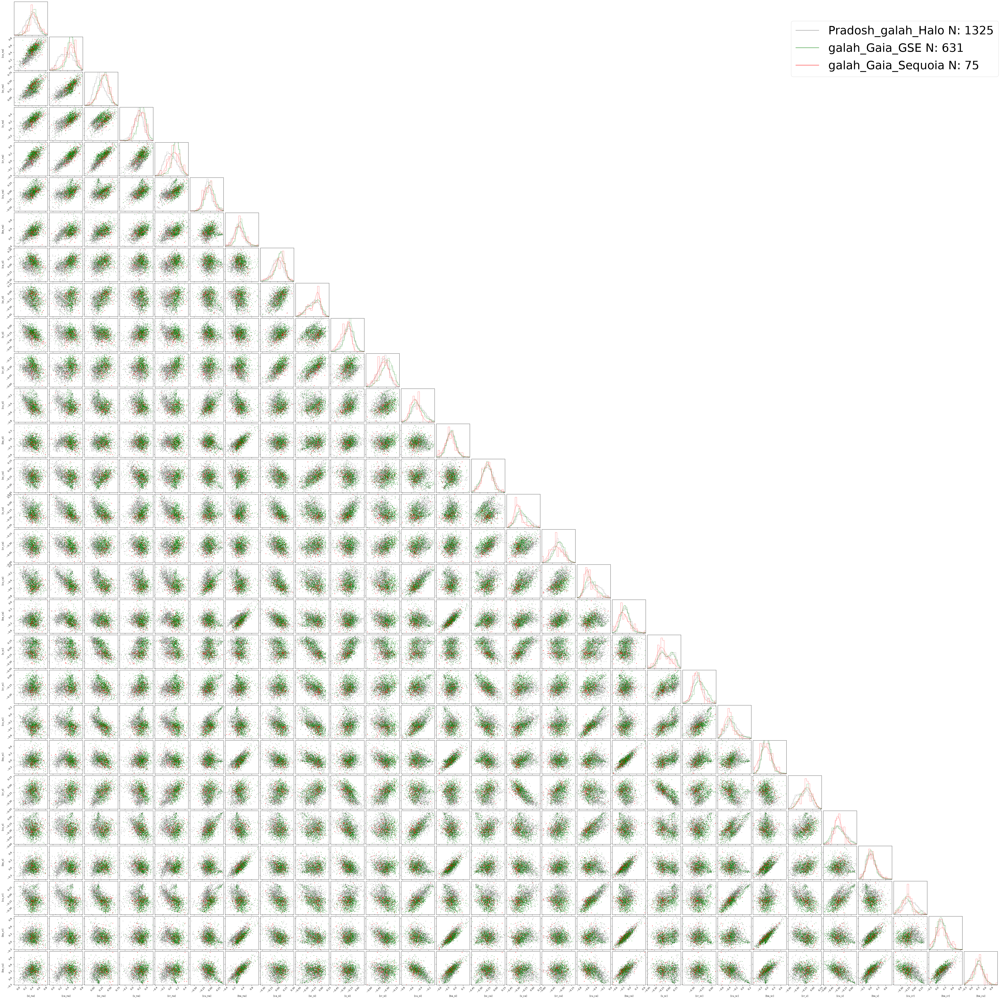

In [15]:
labels = [f'[{label}]' for label in galah_gaia_new_element_ratio_list]

first_plot = 'Pradosh_galah_Halo' #pick one of the keys in corner_datasets
n_components = 2

corner_datasets = {
    "Pradosh_galah_Halo": (Halo_Pradosh_galah_Gaia_new_ratios[galah_gaia_new_element_ratio_list], Halo_Pradosh_galah_Gaia_new_ratios[galah_gaia_new_element_ratio_errors_list],"grey", 2.0, 1.0),
    # "galah_Gaia_Halo": (galah_Gaia_Halo_new_ratios[galah_gaia_new_element_ratio_list], galah_Gaia_Halo_new_ratios[galah_gaia_new_element_ratio_errors_list],"grey", 1, 0.5),
    # "galah_Thickdisk": (thickdisk_galah_Gaia[galah_gaia_new_element_ratio_list], thickdisk_galah_Gaia[galah_gaia_new_element_ratio_errors_list],"purple", 2.5, 1.0),
    "galah_Gaia_GSE": (galah_Gaia_GSE_new_ratios[galah_gaia_new_element_ratio_list], galah_Gaia_GSE_new_ratios[galah_gaia_new_element_ratio_errors_list],"green", 2.0, 1.0),
    "galah_Gaia_Sequoia": (galah_Gaia_Sequoia_new_ratios[galah_gaia_new_element_ratio_list], galah_Gaia_Sequoia_new_ratios[galah_gaia_new_element_ratio_errors_list],"red", 2.5, 1.0),
    # "galah_NGC5139": (galah_Gaia_NGC5139_new_ratios[galah_gaia_new_element_ratio_list], galah_Gaia_NGC5139_new_ratios[galah_gaia_new_element_ratio_errors_list],"blue", 2.5, 1.0),
    # "galah_NGC3201": (galah_Gaia_NGC3201_new_ratios[galah_gaia_new_element_ratio_list], galah_Gaia_NGC3201_new_ratios[galah_gaia_new_element_ratio_errors_list],"purple", 2.5, 1.0),
}

# keys = sorted(corner_datasets.keys())  # sorted = consistent colors across runs
# cmap = plt.cm.tab10
# colors = cmap(np.linspace(0, 0.8, len(keys)))

# for key, color in zip(keys, colors):
#     df_values, df_errors, _, ms, alpha = corner_datasets[key]
#     corner_datasets[key] = (df_values, df_errors, color, ms, alpha)
# # Convert all to values and keep data info

for key in corner_datasets:
    df_values, df_errors, color, ms, alpha = corner_datasets[key] #data frame, color, markersize, alpha

    vals = df_values.to_numpy()
    # vals, mask = filter_constant_columns(vals)
    errs = df_errors.to_numpy()
    row_mask = np.any(np.isfinite(vals), axis=1)
    vals = vals[row_mask]
    errs = errs[row_mask]
    print(f"{key}: {df_values.shape[0]} stars, {df_values.shape[1]} element ratios")
    corner_datasets[key] = (vals, errs, color, ms, alpha)
 
first_values, first_errors, first_color, first_ms, first_alpha = corner_datasets[first_plot]

    # Compute reasonable plotting ranges using percentiles
ranges = []

for dim in range(first_values.shape[1]):

    # combine all datasets for consistent limits
    combined = []

    for key, (values, errors, color, ms, alpha) in corner_datasets.items():
        combined.append(values[:, dim])

    combined = np.concatenate(combined)

    # remove NaNs/infs
    combined = combined[np.isfinite(combined)]

    # percentile clipping
    low = np.percentile(combined, 0.5)
    high = np.percentile(combined, 99.5)

    # optional padding
    padding = 0.05 * (high - low)

    ranges.append((low - padding, high + padding))

fig = corner.corner(
first_values,
labels=labels,
color=first_color,
range = ranges,
data_kwargs={'ms': first_ms, 'alpha': first_alpha, 'color': first_color},
hist_kwargs={"density": True, "histtype": "step", "linewidth": 0.5},
plot_datapoints=True,
plot_contours=False,
fill_contours=False,
plot_density=False,
)

ndim = first_values.shape[1]
axes = np.array(fig.axes).reshape((ndim, ndim))

def overlay_gaussian(values, errors, color, n_components):
    for i in range(ndim):
        ax = axes[i, i]
        x = values[:, i]
        sigma_x = errors[:, i]

        mask = np.isfinite(x) & np.isfinite(sigma_x)
        x = x[mask]

        if len(x) > 5:  # need enough points
            # Fit 2-component Gaussian Mixture
            gmm = GaussianMixture(n_components=n_components)
            gmm.fit(x.reshape(-1, 1))

            x_grid = np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 500)

            pdf = np.zeros_like(x_grid)

            # Sum the two Gaussians
            for weight, mean, cov in zip(gmm.weights_, gmm.means_, gmm.covariances_):
                sigma = np.sqrt(cov[0][0])
                pdf += weight * norm.pdf(x_grid, mean[0], sigma)

                # (optional) plot individual components
                ax.plot(x_grid,
                        weight * norm.pdf(x_grid, mean[0], sigma),
                        color=color,
                        lw=1,
                        # ls='dashed',
                        ls = "none",
                        alpha=0.7)

            # Plot total mixture
            ax.plot(x_grid, pdf, color=color, lw=0.5)

# Overlay remaining datasets
handles = []
for key, (values, errors, color, ms, alpha) in corner_datasets.items():
    if key != first_plot:
        corner.corner(
            values,
            fig=fig,
            color=color,
            range = ranges,
            data_kwargs={'ms': ms, 'alpha': alpha, 'color': color},
            hist_kwargs={"density": True, "histtype": "step", "linewidth": 0.5},
            plot_datapoints=True,
            plot_contours=False,
            fill_contours=False,
            plot_density=False,
            show_titles=(key == "NGC3201"),
        )
    overlay_gaussian(values, errors, color, n_components)
    handles.append(plt.Line2D([0], [0], color = color, label = f'{key} N: {values.shape[0]}'))

fig.legend(handles=handles,
           loc="upper right",
           bbox_to_anchor=(1.0, 0.98),
        #    ncol=len(handles),
        #    frameon=False,
           fontsize=50)

In [16]:

print(len(galah_gaia_new_element_ratio_list))
print(len(galah_gaia_new_element_ratio_errors_list))

28
28


In [17]:
galah_gaia_new_element_ratio_list

['si_na',
 'ca_na',
 'sc_na',
 'v_na',
 'cr_na',
 'cu_na',
 'ba_na',
 'ca_si',
 'sc_si',
 'v_si',
 'cr_si',
 'cu_si',
 'ba_si',
 'sc_ca',
 'v_ca',
 'cr_ca',
 'cu_ca',
 'ba_ca',
 'v_sc',
 'cr_sc',
 'cu_sc',
 'ba_sc',
 'cr_v',
 'cu_v',
 'ba_v',
 'cu_cr',
 'ba_cr',
 'ba_cu']

In [21]:
# element_list = Pradosh_normal_element_list
# element_list_errors = Pradosh_normal_element_list_errors

element_list = []
element_list_copy = galah_gaia_new_element_ratio_list
# element_list_copy = ['v_sc', 'y_mn', 'nd_mn',]
# element_list_copy = ['cr_ca', 'cu_sc', 'ba_v',]
# element_list_copy = ['mn_na', 'mn_ca', 'nd_y']


for i in element_list_copy:
    if i  != 'fe_h':
        print(i)
        element_list.append(i)

element_list_errors = galah_gaia_new_element_ratio_errors_list

feature_cols = element_list

cut_to_use = {
    "Pradosh_Halo": Halo_Pradosh_galah_Gaia_new_ratios,
    # "Halo": galah_Gaia_Halo_new_ratios,
    # "Thick_disk": thickdisk_Pradosh,
    # "GSE": galah_Gaia_GSE_new_ratios,
    "Sequoia": galah_Gaia_Sequoia_new_ratios,
    # "NGC5239": galah_Gaia_NGC5139_new_ratios,
    # "NGC3201": galah_Gaia_NGC3201_new_ratios, # 3201 wont run becasue galah doesn't have any of those stars
}

# Combine the clusters into a single DataFrame
df_list = []
for Group_Name, df in cut_to_use.items():
    df_copy = df.copy()
    df_copy["Group_Name"] = Group_Name  # label column
    df_list.append(df_copy)

df_all = pd.concat(df_list, ignore_index=True)
final_output = []
for ratio1 in range(len(feature_cols)):
    for ratio2 in range(ratio1+1,len(feature_cols)):
        for ratio3 in range(ratio2+1,len(feature_cols)):
            # for ratio4 in range(ratio3+1,len(feature_cols)):

                col1 = feature_cols[ratio1]
                col2 = feature_cols[ratio2]
                col3 = feature_cols[ratio3]
                # col4 = feature_cols[ratio4]
                
                print(f'{col1}, {col2}, {col3}')
                # print(f'{col1}, {col2}, {col3}, {col4}')

                X = df_all[[col1, col2, col3]]#.copy()
                # X = df_all[[col1, col2, col3, col4]]#.copy()
                y = df_all["Group_Name"]#.copy()

                # Remove rows where the feature is NaN
                # mask = X[feature_cols[ratio1], feature_cols[ratio2]].notna()
                # X = X[mask]
                # y = y[mask]

                # Split into train/test sets
                test_size = 0.2 if X.shape[0] > 10 else 0.1  # adjust test size for very small clusters
                X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=test_size, random_state=42, stratify=y
                )

                # Train Random Forest classifier
                clf = RandomForestClassifier(n_estimators=500, 
                                            random_state=42,
                                            n_jobs=-1   # <-- uses all cores
                                            )
                clf.fit(X_train, y_train)

                # Predict and calculate accuracy
                y_pred = clf.predict(X_test)
                acc = accuracy_score(y_test, y_pred) # (TP + TN) / (TP + TN + FP + FN)
                precision = precision_score(y_test, y_pred, pos_label="Sequoia") # (TP) / (TP + FP) # compare to the total number of correctly predicted positive instances to 
                recall = recall_score(y_test, y_pred, pos_label="Sequoia") # (TP) / (TP + FN) compare to the total number of correctly predicted positive instances to actual positive instances in the dataset. It is a measure of how well the model identifies positive instances.

                # cm = confusion_matrix(y_test, y_pred)
                # ConfusionMatrixDisplay(confusion_matrix=cm).plot();

                final_output.append({
                "ratio1": col1,
                "ratio2": col2,
                "ratio3": col3,
                # "ratio4": col4,
                "accuracy": acc,
                "y_pred": y_pred,
                "precision": precision,
                "recall": recall,
                })
final_output = pd.DataFrame(final_output)
final_output = final_output.sort_values(
    by="accuracy",
    ascending=False
).reset_index(drop=True)

final_output_Galah = final_output

si_na
ca_na
sc_na
v_na
cr_na
cu_na
ba_na
ca_si
sc_si
v_si
cr_si
cu_si
ba_si
sc_ca
v_ca
cr_ca
cu_ca
ba_ca
v_sc
cr_sc
cu_sc
ba_sc
cr_v
cu_v
ba_v
cu_cr
ba_cr
ba_cu
si_na, ca_na, sc_na
/Users/simoncorrera/miniconda3/envs/sequoia/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])

si_na, ca_na, v_na
/Users/simoncorrera/miniconda3/envs/sequoia/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])

si_na, ca_na, cr_na
/Users/simoncorrera/miniconda3/envs/sequoia/lib/python3.13/site-packages/sklearn/metri

In [22]:
final_output_Galah

,ratio1,ratio2,ratio3,accuracy,y_pred,precision,recall
0,si_na,v_si,cu_sc,0.953571,"[Pradosh_Halo, Pradosh_Halo, Pradosh_Halo, Pra...",1.000000,0.133333
1,si_na,ca_si,cu_si,0.953571,"[Pradosh_Halo, Pradosh_Halo, Pradosh_Halo, Pra...",1.000000,0.133333
2,si_na,ca_si,cu_ca,0.953571,"[Pradosh_Halo, Pradosh_Halo, Pradosh_Halo, Pra...",1.000000,0.133333
3,si_na,cu_si,cu_ca,0.953571,"[Pradosh_Halo, Pradosh_Halo, Pradosh_Halo, Pra...",1.000000,0.133333
4,ba_na,ba_sc,cr_v,0.950000,"[Pradosh_Halo, Pradosh_Halo, Pradosh_Halo, Pra...",0.666667,0.133333
...,...,...,...,...,...,...,...
3271,cu_si,ba_sc,ba_v,0.932143,"[Pradosh_Halo, Pradosh_Halo, Pradosh_Halo, Pra...",0.000000,0.000000
3272,v_ca,ba_ca,cr_sc,0.932143,"[Pradosh_Halo, Pradosh_Halo, Pradosh_Halo, Pra...",0.166667,0.066667
3273,ca_na,ba_na,ba_ca,0.932143,"[Pradosh_Halo, Pradosh_Halo, Pradosh_Halo, Pra...",0.166667,0.066667
3274,cu_sc,ba_sc,ba_cu,0.932143,"[Pradosh_Halo, Pradosh_Halo, Pradosh_Halo, Pra...",0.000000,0.000000


In [24]:
# ''' MINI CORNER PLOTS '''
# labels = ['fe_h', 'mn_fe', 'cu_fe'] # best
# # labels = ['cu_fe', 'mg_ca', 'nd_mg'] # 2nd best
# # labels = ['fe_h', 'ca_fe', 'cu_fe'] # 3rd best
# # labels = ['fe_h', 'cu_fe', 'mn_ca'] # 4th best
# # labels = ['fe_h', 'mg_ca', 'nd_na'] # 5th best


# labels = ['TiCa', 'NiSi', 'cu_fe'] # best
# labels = ['cu_fe', 'mg_ca', 'nd_mg'] # 2nd best
# # labels = ['fe_h', 'ca_fe', 'cu_fe'] # 3rd best
# # labels = ['fe_h', 'cu_fe', 'mn_ca'] # 4th best
# # labels = ['fe_h', 'mg_ca', 'nd_na'] # 5th best
# e_labels = []
# for i in labels:
#     e_labels.append('e_' + i)

# first_plot = 'galah_Gaia_Halo' #pick one of the keys in corner_datasets
# n_components = 2


parent_folder = "/Users/simoncorrera/Desktop/MQ NGC3201 project copy/plots"

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
save_folder = os.path.join(
    parent_folder,
    f"{timestamp}_Galah_Sequoia_vs_Pradosh_Halo_3d_Na_Si_Ca_Sc_V_Cr_Cu_Ba_also_fe_is_lessthan_minus0.75_galah_phase_1_2_Hermes"
)                                      # This contains the name of the folder
os.makedirs(save_folder, exist_ok=True)

save_folder_Acc = os.path.join(
    save_folder,
    f"Accuracy"
)                                      # This contains the name of the folder
os.makedirs(save_folder_Acc, exist_ok=True)

save_folder_percision = os.path.join(
    save_folder,
    f"Precision"
)                                      # This contains the name of the folder
os.makedirs(save_folder_percision, exist_ok=True)

save_folder_recall = os.path.join(
    save_folder,
    f"Recall"
)                                      # This contains the name of the folder
os.makedirs(save_folder_recall, exist_ok=True)

# Save sample_set to the same folder
sample_set = final_output_Galah
sample_set.to_csv(
    os.path.join(save_folder, "full_csv.csv"),
    index=False
)

for sub_save_folder in [save_folder_Acc, save_folder_percision, save_folder_recall]:
    os.makedirs(sub_save_folder, exist_ok=True)

    if sub_save_folder == save_folder_Acc:
        metric = "accuracy"
    elif sub_save_folder == save_folder_percision:
        metric = "precision"
    elif sub_save_folder == save_folder_recall:
        metric = "recall"


    ''' MINI CORNER PLOTS '''


    # e_labels = []
    # for i in labels:
    #     e_labels.append('e_' + i)
    sample_set = final_output_Galah.sort_values(by=metric, ascending=False).reset_index(drop=True)
    TOP_50_ = top_min_corner_plots(sample_set, 50)
    TOP_lables = min_corner_plot_lables_comparison(sample_set, 50, metric)
    

    for i in range(len(TOP_lables[0])):
        labels = TOP_lables[0][i]
        e_labels = TOP_lables[1][i]
        metric_value = TOP_lables[2][i]

        first_plot = 'Pradosh_galah_Halo' #pick one of the keys in corner_datasets
        n_components = 2

        corner_datasets = {
            "Pradosh_galah_Halo": (Halo_Pradosh_galah_Gaia_new_ratios[labels], Halo_Pradosh_galah_Gaia_new_ratios[e_labels],"grey", 1, 0.75),
            # "galah_Gaia_Halo": (galah_Gaia_Halo_new_ratios[labels], galah_Gaia_Halo_new_ratios[e_labels],"grey", 1, 0.75),
            # "galah_Thickdisk": (thickdisk_galah_Gaia[labels], thickdisk_galah_Gaia[e_labels],"purple", 2.5, 1.0),
            "galah_Gaia_GSE": (galah_Gaia_GSE_new_ratios[labels], galah_Gaia_GSE_new_ratios[e_labels],"green", 5, 1.0),
            "galah_Gaia_Sequoia": (galah_Gaia_Sequoia_new_ratios[labels], galah_Gaia_Sequoia_new_ratios[e_labels],"red", 5, 1.0),
            # "galah_NGC5139": (galah_Gaia_NGC5139_new_ratios[labels], galah_Gaia_NGC5139_new_ratios[e_labels],"blue", 2.5, 1.0),
            # "galah_NGC3201": (galah_Gaia_NGC3201_new_ratios[labels], galah_Gaia_NGC3201_new_ratios[e_labels],"purple", 2.5, 1.0),
        }

        # keys = sorted(corner_datasets.keys())  # sorted = consistent colors across runs
        # cmap = plt.cm.tab10
        # colors = cmap(np.linspace(0, 0.8, len(keys)))

        # for key, color in zip(keys, colors):
        #     df_values, df_errors, _, ms, alpha = corner_datasets[key]
        #     corner_datasets[key] = (df_values, df_errors, color, ms, alpha)
        # # Convert all to values and keep data info

        for key in corner_datasets:
            df_values, df_errors, color, ms, alpha = corner_datasets[key] #data frame, color, markersize, alpha

            vals = df_values.to_numpy()
            # vals, mask = filter_constant_columns(vals)
            errs = df_errors.to_numpy()
            row_mask = np.any(np.isfinite(vals), axis=1)
            vals = vals[row_mask]
            errs = errs[row_mask]
            print(f"{key}: {df_values.shape[0]} stars, {df_values.shape[1]} element ratios")
            corner_datasets[key] = (vals, errs, color, ms, alpha)

            
        
        first_values, first_errors, first_color, first_ms, first_alpha = corner_datasets[first_plot]

        # Compute reasonable plotting ranges using percentiles
        ranges = []

        for dim in range(first_values.shape[1]):

            # combine all datasets for consistent limits
            combined = []

            for key, (values, errors, color, ms, alpha) in corner_datasets.items():
                combined.append(values[:, dim])

            combined = np.concatenate(combined)

            # remove NaNs/infs
            combined = combined[np.isfinite(combined)]

            # percentile clipping
            low = np.percentile(combined, 3)
            high = np.percentile(combined, 97)

            # optional padding
            padding = 0.05 * (high - low)

            ranges.append((low - padding, high + padding))

        fig = corner.corner(
        first_values,
        labels=labels,
        range=ranges,
        color=first_color,
        data_kwargs={'ms': first_ms, 'alpha': first_alpha, 'color': first_color},
        hist_kwargs={"density": True, "histtype": "step", "linewidth": 0.5},
        plot_datapoints=True,
        plot_contours=False,
        fill_contours=False,
        plot_density=False,
        )

        ACC = round(metric_value, 4)
        fig.suptitle(f'{metric.capitalize()}: {ACC}', fontsize=16, y=0.98)
        
        ndim = first_values.shape[1]
        axes = np.array(fig.axes).reshape((ndim, ndim))

        # Function to overlay Gaussian
        # def overlay_gaussian(values, errors, color):
        #     for i in range(ndim):
        #         ax = axes[i, i]
        #         x = values[:, i]
        #         sigma_x = errors[:,i]
        #         mask = np.isfinite(x) & np.isfinite(sigma_x)
        #         x = x[mask]
        #         sigma_x = sigma_x[mask]
        #         if len(x) > 1:
        #             mu, sigma = weighted_avg_and_std(x, sigma_x) #now this should be weighting the errors better
        #             weights  = 1 / sigma_x**2
        #             x_grid = np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 500)
        #             ax.plot(x_grid, norm.pdf(x_grid, mu, sigma), color=color, lw=2)

        def overlay_gaussian(values, errors, color, n_components):
            for i in range(ndim):
                ax = axes[i, i]
                x = values[:, i]
                sigma_x = errors[:, i]

                mask = np.isfinite(x) & np.isfinite(sigma_x)
                x = x[mask]

                if len(x) > 5:  # need enough points
                    # Fit 2-component Gaussian Mixture
                    gmm = GaussianMixture(n_components=n_components)
                    gmm.fit(x.reshape(-1, 1))

                    x_grid = np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 500)

                    pdf = np.zeros_like(x_grid)

                    # Sum the two Gaussians
                    for weight, mean, cov in zip(gmm.weights_, gmm.means_, gmm.covariances_):
                        sigma = np.sqrt(cov[0][0])
                        pdf += weight * norm.pdf(x_grid, mean[0], sigma)

                        # (optional) plot individual components
                        ax.plot(x_grid,
                                weight * norm.pdf(x_grid, mean[0], sigma),
                                color=color,
                                lw=1,
                                # ls='dashed',
                                ls = "none",
                                alpha=0.7)

                    # Plot total mixture
                    ax.plot(x_grid, pdf, color=color, lw=0.5)

        # Overlay remaining datasets
        handles = []
        for key, (values, errors, color, ms, alpha) in corner_datasets.items():
            if key != first_plot:
                corner.corner(
                    values,
                    fig=fig,
                    color=color,
                    range=ranges,
                    data_kwargs={'ms': ms, 'alpha': alpha, 'color': color},
                    hist_kwargs={"density": True, "histtype": "step", "linewidth": 0.5},
                    plot_datapoints=True,
                    plot_contours=False,
                    fill_contours=False,
                    plot_density=False,
                    show_titles=(key == "NGC3201"),
                )
            overlay_gaussian(values, errors, color, n_components)
            handles.append(plt.Line2D([0], [0], color = color, label = f'{key} N: {values.shape[0]}'))

        fig.legend(handles=handles,
                loc="upper right",
                bbox_to_anchor=(1.0, 0.98),
                #    ncol=len(handles),
                #    frameon=False,
                fontsize=12)
        
        # Save into new folder
        plt.savefig(os.path.join(sub_save_folder, f"plot_{i}_{labels}.png"))

        plt.close()

Pradosh_galah_Halo: 1325 stars, 3 element ratios
galah_Gaia_GSE: 631 stars, 3 element ratios
galah_Gaia_Sequoia: 75 stars, 3 element ratios
Pradosh_galah_Halo: 1325 stars, 3 element ratios
galah_Gaia_GSE: 631 stars, 3 element ratios
galah_Gaia_Sequoia: 75 stars, 3 element ratios
Pradosh_galah_Halo: 1325 stars, 3 element ratios
galah_Gaia_GSE: 631 stars, 3 element ratios
galah_Gaia_Sequoia: 75 stars, 3 element ratios
Pradosh_galah_Halo: 1325 stars, 3 element ratios
galah_Gaia_GSE: 631 stars, 3 element ratios
galah_Gaia_Sequoia: 75 stars, 3 element ratios
Pradosh_galah_Halo: 1325 stars, 3 element ratios
galah_Gaia_GSE: 631 stars, 3 element ratios
galah_Gaia_Sequoia: 75 stars, 3 element ratios
Pradosh_galah_Halo: 1325 stars, 3 element ratios
galah_Gaia_GSE: 631 stars, 3 element ratios
galah_Gaia_Sequoia: 75 stars, 3 element ratios
Pradosh_galah_Halo: 1325 stars, 3 element ratios
galah_Gaia_GSE: 631 stars, 3 element ratios
galah_Gaia_Sequoia: 75 stars, 3 element ratios
Pradosh_galah_Halo: 